In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import os
from datetime import datetime
import mne
from mne.preprocessing import ICA
from scipy import signal
import warnings
import traceback

warnings.filterwarnings("ignore", category=RuntimeWarning)

log_path = "data_logs/Aws Safi"
data_path = "data"


In [3]:
for file in os.listdir("data"):
    if file.endswith("csv"):
        with open(f"data/{file}", 'r') as f:
            l = f.readlines()
            if not l[0].startswith('Timestamp') and l[1].startswith('Timestamp'):
                l = l[1:]
        with open(f"data/{file}", 'w') as f:
            f.writelines(l)

In [4]:
def add_three_hours(timestamp):
    k = timestamp.split('T')
    k[1]= str(int(k[1][:2])+3)+k[1][2:]
    return 'T'.join(k)
def mp(c):
    """Convert log color markers to valid Plotly colors"""
    if c.strip()=="'blue'":
        return 'blue'
    if c.strip()=="'lightblue'":
        return 'red'
    return 'black'

logs = {}
for log_file in os.listdir(log_path):
    if not log_file.endswith('.txt'):
        continue
    identifier = log_file.split("_run")[1].split(".")[0]
    try:
        with open(f"{log_path}/{log_file}", "r") as f:
            a = f.readlines()
            if not a:
                print(f"WARNING: Empty log file: {log_file}")
                continue
            logs[identifier] = [
                (datetime.strptime(add_three_hours(line.split(" ")[0]), "[%Y-%m-%dT%H:%M:%S.%fZ]").timestamp(),
                 mp(line.split(" ")[-1]),
                 " ".join(line.split(" ")[2:]))
                for line in a
                if 'blue' in line or '+' in line
            ]
    except Exception as e:
        print(f"ERROR parsing log file {log_file}: {str(e)}")

print(f"Successfully parsed {len(logs)} log files")

def validate_csv(file_path):
    """Validate if a CSV file is readable and has data"""
    try:
        if not os.path.exists(file_path):
            return False, "File does not exist"

        if os.path.getsize(file_path) == 0:
            return False, "File is empty"

        with open(file_path, 'r') as f:
            first_lines = []
            for i, line in enumerate(f):
                if i >= 5:
                    break
                first_lines.append(line)

            if not first_lines:
                return False, "File has no content"

            if not ',' in first_lines[0]:
                return False, "File does not appear to be a valid CSV"
        try:
            df_sample = pd.read_csv(file_path, nrows=5)
            if df_sample.empty:
                return False, "Pandas could not read any rows"
            return True, "Valid"
        except pd.errors.EmptyDataError:
            return False, "No columns to parse from file"
        except pd.errors.ParserError:
            return False, "Parser error - file may be corrupted"
        except Exception as e:
            return False, f"Error reading with pandas: {str(e)}"

    except Exception as e:
        return False, f"Validation error: {str(e)}"

Successfully parsed 3 log files


In [5]:
def match_timestamps_to_df_index(df, time_periods):
    """
    Efficiently match start and end timestamps to the closest times in the dataframe index.
    
    Parameters:
    df (pandas.DataFrame): DataFrame with a datetime index
    time_periods (list): List of tuples containing (start_time, end_time)
    
    Returns:
    list: List of tuples with matched (start_time, end_time) that exist in df.index
    """
    index_array = df.index.to_numpy()
    matched_periods = []
    
    for start_time, end_time in time_periods:
        start_dt = np.datetime64(pd.to_datetime(start_time))
        end_dt = np.datetime64(pd.to_datetime(end_time))

        start_pos = np.searchsorted(index_array, start_dt)
        end_pos = np.searchsorted(index_array, end_dt)
        
        if start_pos >= len(index_array):
            start_pos = len(index_array) - 1
        if end_pos >= len(index_array):
            end_pos = len(index_array) - 1
            
        start_time_matched = index_array[start_pos]
        end_time_matched = index_array[end_pos]
        
        matched_periods.append((start_time_matched, end_time_matched))
    
    return matched_periods

In [6]:
dsets = {}
for file in os.listdir(data_path):
    if file.endswith(".csv"):
        identifier = ''.join(char for char in file.split("_")[0] if char.isdigit())
        if identifier not in logs:
            continue
        temp_df = pd.read_csv(f"{data_path}/{file}")
        temp_df.set_index('Timestamp', inplace=True)
        temp_df.index = pd.to_datetime(temp_df.index)
        eeg_channels = [col for col in temp_df.columns if col.startswith('EEG.') and
                       not any(x in col for x in ['Counter', 'Interpolated', 'RawCq', 'Battery', 'MarkerHardware'])]
        temp_df = temp_df[eeg_channels]
        overt = {"start":[], "end":[]}
        covert = {"start":[], "end":[]}
        for i,log in enumerate(logs[identifier]):
            if log[1] == 'red':
                overt['start'].append(log[0])
                overt['end'].append(logs[identifier][i+1][0])  
            elif log[1] == 'blue':
                covert['start'].append(log[0])
                covert['end'].append(logs[identifier][i+1][0])
        idx = temp_df.index.to_numpy()
        overt_start_idx = np.searchsorted(idx, overt['start'])
        overt_end_idx = np.searchsorted(idx, overt['end'])
        covert_start_idx = np.searchsorted(idx, covert['start'])
        covert_end_idx = np.searchsorted(idx, covert['end'])
        
        overt_series = []

        for start, end in zip(overt_start_idx, overt_end_idx):
            overt_series.append(temp_df.iloc[start:end])
        covert_series = []  
        for start, end in zip(covert_start_idx, covert_end_idx):
            covert_series.append(temp_df.iloc[start:end])
        dsets[identifier] = {
            "overt": overt_series,
            "covert": covert_series
        } 

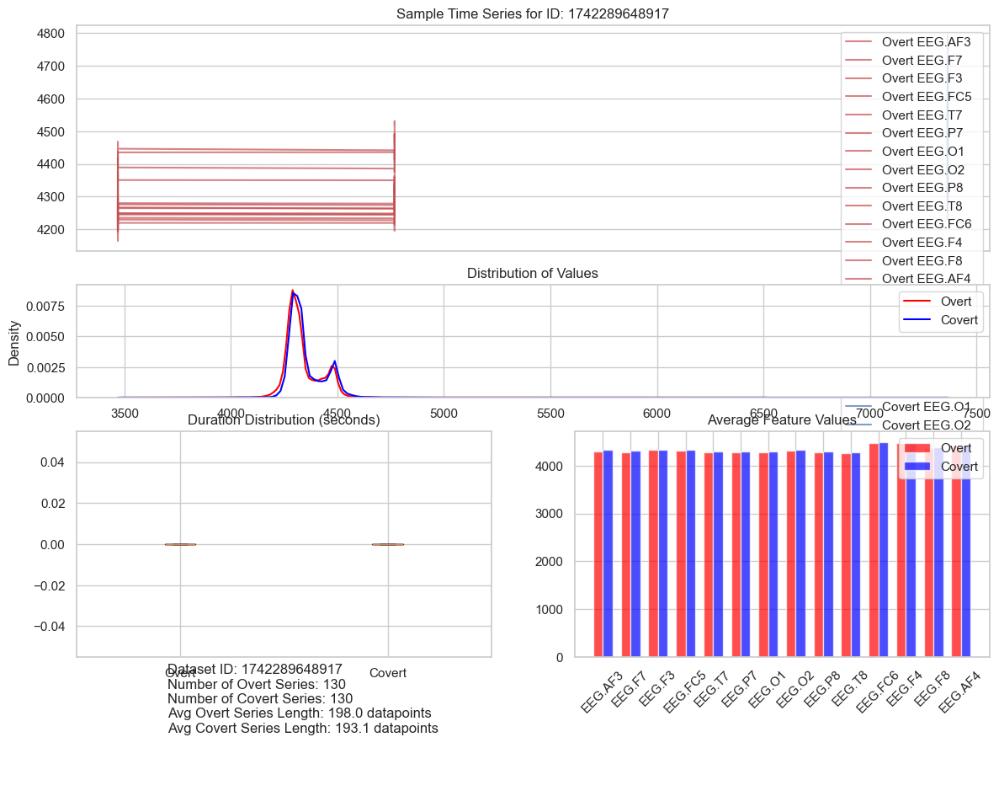

In [7]:

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.gridspec import GridSpec

def visualize_dataset(dsets, sample_id=None):
    """
    Visualize the datasets with comparisons between overt and covert series.
    
    Args:
        dsets: Dictionary containing the dataset
        sample_id: Optional ID to visualize a specific sample. If None, first sample is used.
    """
    # Set the style
    sns.set(style="whitegrid")
    plt.figure(figsize=(14, 12))
    
    # If no sample_id provided, use the first one in the dictionary
    if sample_id is None:
        sample_id = list(dsets.keys())[0]
    
    # Get the data for the specified sample
    sample_data = dsets[sample_id]
    overt_series = sample_data["overt"]
    covert_series = sample_data["covert"]
    
    # Create a layout with GridSpec
    gs = GridSpec(4, 2, height_ratios=[2, 1, 2, 1])
    
    # Plot time series summary
    ax1 = plt.subplot(gs[0, :])
    
    # Plot a representative overt and covert series to compare
    if len(overt_series) > 0:
        overt_example = overt_series[0]
        for col in overt_example.columns:
            ax1.plot(overt_example.index, overt_example[col], 'r-', alpha=0.7, label=f'Overt {col}')
    
    if len(covert_series) > 0:
        covert_example = covert_series[0]
        for col in covert_example.columns:
            ax1.plot(covert_example.index, covert_example[col], 'b-', alpha=0.7, label=f'Covert {col}')
    
    ax1.set_title(f'Sample Time Series for ID: {sample_id}')
    ax1.legend(loc='upper right')
    
    # Distribution comparison of values
    ax2 = plt.subplot(gs[1, :])
    
    all_overt_values = []
    all_covert_values = []
    
    for series in overt_series:
        for col in series.columns:
            all_overt_values.extend(series[col].values)
    
    for series in covert_series:
        for col in series.columns:
            all_covert_values.extend(series[col].values)
    
    if all_overt_values and all_covert_values:
        sns.kdeplot(all_overt_values, color='red', label='Overt', ax=ax2)
        sns.kdeplot(all_covert_values, color='blue', label='Covert', ax=ax2)
        ax2.set_title('Distribution of Values')
        ax2.legend()
    
    # Durations analysis
    ax3 = plt.subplot(gs[2, 0])
    overt_durations = [(series.index[-1] - series.index[0]).total_seconds() for series in overt_series if not series.empty]
    covert_durations = [(series.index[-1] - series.index[0]).total_seconds() for series in covert_series if not series.empty]
    
    if overt_durations and covert_durations:
        ax3.boxplot([overt_durations, covert_durations], labels=['Overt', 'Covert'])
        ax3.set_title('Duration Distribution (seconds)')
    
    # Feature comparison (e.g., mean values of each column)
    ax4 = plt.subplot(gs[2, 1])
    
    if overt_series and covert_series:
        # Get columns from first series
        columns = overt_series[0].columns if not overt_series[0].empty else covert_series[0].columns
        
        overt_means = {}
        covert_means = {}
        
        for col in columns:
            overt_values = [series[col].mean() for series in overt_series if not series.empty and col in series.columns]
            covert_values = [series[col].mean() for series in covert_series if not series.empty and col in series.columns]
            
            if overt_values:
                overt_means[col] = np.mean(overt_values)
            if covert_values:
                covert_means[col] = np.mean(covert_values)
        
        feature_names = list(overt_means.keys())
        x = np.arange(len(feature_names))
        width = 0.35
        
        ax4.bar(x - width/2, list(overt_means.values()), width, label='Overt', color='red', alpha=0.7)
        ax4.bar(x + width/2, list(covert_means.values()), width, label='Covert', color='blue', alpha=0.7)
        
        ax4.set_xticks(x)
        ax4.set_xticklabels(feature_names, rotation=45)
        ax4.set_title('Average Feature Values')
        ax4.legend()
    
    # Summary statistics
    ax5 = plt.subplot(gs[3, :])
    ax5.axis('off')
    
    summary_text = f"Dataset ID: {sample_id}\n"
    summary_text += f"Number of Overt Series: {len(overt_series)}\n"
    summary_text += f"Number of Covert Series: {len(covert_series)}\n"
    
    if overt_series:
        summary_text += f"Avg Overt Series Length: {np.mean([len(s) for s in overt_series]):.1f} datapoints\n"
    if covert_series:
        summary_text += f"Avg Covert Series Length: {np.mean([len(s) for s in covert_series]):.1f} datapoints\n"
    
    ax5.text(0.1, 0.5, summary_text, fontsize=12)
    
    return plt

# Example usage
plt = visualize_dataset(dsets)
plt.show()


In [8]:
import pandas as pd

# Check segment counts and temporal relationships
for identifier in dsets:
    overt_segments = dsets[identifier]['overt']
    covert_segments = dsets[identifier]['covert']
    
    print(f"\nIdentifier: {identifier}")
    print(f"Overt segments: {len(overt_segments)}")
    print(f"Covert segments: {len(covert_segments)}")
    
    # Check temporal sequence
    all_events = []
    for seg in overt_segments:
        all_events.append(('overt', seg.index[0], seg.index[-1]))
    for seg in covert_segments:
        all_events.append(('covert', seg.index[0], seg.index[-1]))
    
    # Sort events by start time
    all_events.sort(key=lambda x: x[1])
    
    # Print temporal sequence
    print("\nTemporal sequence of segments:")
    for event in all_events:
        print(f"{event[1]} to {event[2]} - {event[0]}")
    
    # Check for overlaps
    previous_end = None
    for event in all_events:
        if previous_end is not None and event[1] < previous_end:
            print(f"OVERLAP DETECTED: {event[0]} segment starts at {event[1]} before previous segment ends at {previous_end}")
        previous_end = event[2]

# Check feature dimensions
sample_overt = next(iter(dsets.values()))['overt'][0]
sample_covert = next(iter(dsets.values()))['covert'][0]
print(f"\nSample overt shape: {sample_overt.shape}")
print(f"Sample covert shape: {sample_covert.shape}")
print("Columns:", sample_overt.columns.tolist())


Identifier: 1742289648917
Overt segments: 130
Covert segments: 130

Temporal sequence of segments:
1970-01-01 00:00:01.742289652 to 1970-01-01 00:00:01.742289653 - overt
1970-01-01 00:00:01.742289655 to 1970-01-01 00:00:01.742289655 - covert
1970-01-01 00:00:01.742289657 to 1970-01-01 00:00:01.742289658 - overt
1970-01-01 00:00:01.742289660 to 1970-01-01 00:00:01.742289660 - covert
1970-01-01 00:00:01.742289662 to 1970-01-01 00:00:01.742289663 - overt
1970-01-01 00:00:01.742289665 to 1970-01-01 00:00:01.742289665 - covert
1970-01-01 00:00:01.742289667 to 1970-01-01 00:00:01.742289668 - overt
1970-01-01 00:00:01.742289670 to 1970-01-01 00:00:01.742289671 - covert
1970-01-01 00:00:01.742289673 to 1970-01-01 00:00:01.742289673 - overt
1970-01-01 00:00:01.742289675 to 1970-01-01 00:00:01.742289676 - covert
1970-01-01 00:00:01.742289678 to 1970-01-01 00:00:01.742289678 - overt
1970-01-01 00:00:01.742289680 to 1970-01-01 00:00:01.742289681 - covert
1970-01-01 00:00:01.742289683 to 1970-01-0

In [26]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

class CovertOvertDataset(Dataset):
    def __init__(self, dsets, identifiers, scaler=None, train=True):
        self.pairs = []
        self.scaler = scaler
        self.train = train
        
        for id in identifiers:
            covert_segments = dsets[id]['covert']
            overt_segments = dsets[id]['overt']
            for cov, ovt in zip(covert_segments, overt_segments):
                self.pairs.append((cov.values, ovt.values))
                
        if self.scaler is None and self.train:
            all_data = np.vstack([p[0] for p in self.pairs] + [p[1] for p in self.pairs])
            self.scaler = StandardScaler().fit(all_data)
            
    
    def __getitem__(self, idx):
        covert, overt = self.pairs[idx]
        covert = self.scaler.transform(covert)
        overt = self.scaler.transform(overt)
        return (torch.FloatTensor(covert), 
                torch.FloatTensor(overt))
    def __len__(self):
        return len(self.pairs)


In [27]:
all_identifiers = list(dsets.keys())
train_ids, val_ids = train_test_split(all_identifiers, test_size=0.2, random_state=42)

train_dataset = CovertOvertDataset(dsets, train_ids)
val_dataset = CovertOvertDataset(dsets, val_ids, scaler=train_dataset.scaler, train=False)

In [28]:
# Padding for variable size vectors
def collate_fn(batch):
    src_seqs = [item[0] for item in batch]
    tgt_seqs = [item[1] for item in batch]
    
    src_lens = [len(seq) for seq in src_seqs]
    tgt_lens = [len(seq) for seq in tgt_seqs]
    
    src_padded = nn.utils.rnn.pad_sequence(src_seqs, batch_first=True)
    tgt_padded = nn.utils.rnn.pad_sequence(tgt_seqs, batch_first=True)
    
    return src_padded, tgt_padded, src_lens, tgt_lens

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=32, collate_fn=collate_fn)

In [32]:
i=0
for src, tgt, src_lens, tgt_lens in train_loader:
    print(src.shape, tgt.shape)  
    i+=1
    if i>10:
        break


torch.Size([32, 257, 14]) torch.Size([32, 256, 14])
torch.Size([32, 256, 14]) torch.Size([32, 256, 14])
torch.Size([32, 257, 14]) torch.Size([32, 256, 14])
torch.Size([32, 256, 14]) torch.Size([32, 256, 14])
torch.Size([32, 257, 14]) torch.Size([32, 257, 14])
torch.Size([32, 257, 14]) torch.Size([32, 257, 14])
torch.Size([32, 257, 14]) torch.Size([32, 257, 14])
torch.Size([32, 257, 14]) torch.Size([32, 257, 14])
torch.Size([4, 256, 14]) torch.Size([4, 257, 14])


In [39]:
class Seq2Seq(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers=2):
        super().__init__()
        self.encoder = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        self.decoder = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
        
    def forward(self, src, tgt):
        _, (hidden, cell) = self.encoder(src)
        outputs, _ = self.decoder(tgt, (hidden, cell))
        predictions = self.fc(outputs)
        return predictions


In [40]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = Seq2Seq(input_dim=14, hidden_dim=256, output_dim=14, num_layers=2).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5)

In [41]:
def train_epoch(model, loader):
    model.train()
    total_loss = 0
    for src, tgt, src_lens, tgt_lens in loader:
        src, tgt = src.to(device), tgt.to(device)
        optimizer.zero_grad()
        
        output = model(src, tgt[:, :-1, :])
        loss = criterion(output, tgt[:, 1:, :])
        
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

def validate(model, loader):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for src, tgt, src_lens, tgt_lens in loader:
            src, tgt = src.to(device), tgt.to(device)
            output = model(src, tgt[:, :-1, :])
            loss = criterion(output, tgt[:, 1:, :])
            total_loss += loss.item()
    return total_loss / len(loader)


In [42]:
best_val_loss = float('inf')
patience = 5
no_improve = 0

for epoch in range(100):
    train_loss = train_epoch(model, train_loader)
    val_loss = validate(model, val_loader)
    scheduler.step(val_loss)
    
    print(f'Epoch {epoch+1:03d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}')
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        no_improve = 0
        torch.save(model.state_dict(), 'best_model.pth')
    else:
        no_improve += 1
        
    if no_improve >= patience:
        print("Early stopping")
        break

model.load_state_dict(torch.load('best_model.pth'))

Epoch 001 | Train Loss: 0.8028 | Val Loss: 0.8678
Epoch 002 | Train Loss: 0.6513 | Val Loss: 0.7483
Epoch 003 | Train Loss: 0.5681 | Val Loss: 0.6580
Epoch 004 | Train Loss: 0.5236 | Val Loss: 0.5997
Epoch 005 | Train Loss: 0.4294 | Val Loss: 0.5282
Epoch 006 | Train Loss: 0.4120 | Val Loss: 0.4857
Epoch 007 | Train Loss: 0.3252 | Val Loss: 0.4474
Epoch 008 | Train Loss: 0.2922 | Val Loss: 0.4110
Epoch 009 | Train Loss: 0.2648 | Val Loss: 0.3877
Epoch 010 | Train Loss: 0.2407 | Val Loss: 0.3687
Epoch 011 | Train Loss: 0.2249 | Val Loss: 0.3481
Epoch 012 | Train Loss: 0.2028 | Val Loss: 0.3350
Epoch 013 | Train Loss: 0.1909 | Val Loss: 0.3259
Epoch 014 | Train Loss: 0.1799 | Val Loss: 0.3180
Epoch 015 | Train Loss: 0.1720 | Val Loss: 0.3035
Epoch 016 | Train Loss: 0.1805 | Val Loss: 0.3004
Epoch 017 | Train Loss: 0.1715 | Val Loss: 0.2936
Epoch 018 | Train Loss: 0.1609 | Val Loss: 0.2998
Epoch 019 | Train Loss: 0.1488 | Val Loss: 0.2836
Epoch 020 | Train Loss: 0.1453 | Val Loss: 0.2849


C:\Users\Administrator\AppData\Local\Temp\ipykernel_18368\1219806401.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))

<All keys matched successfully>

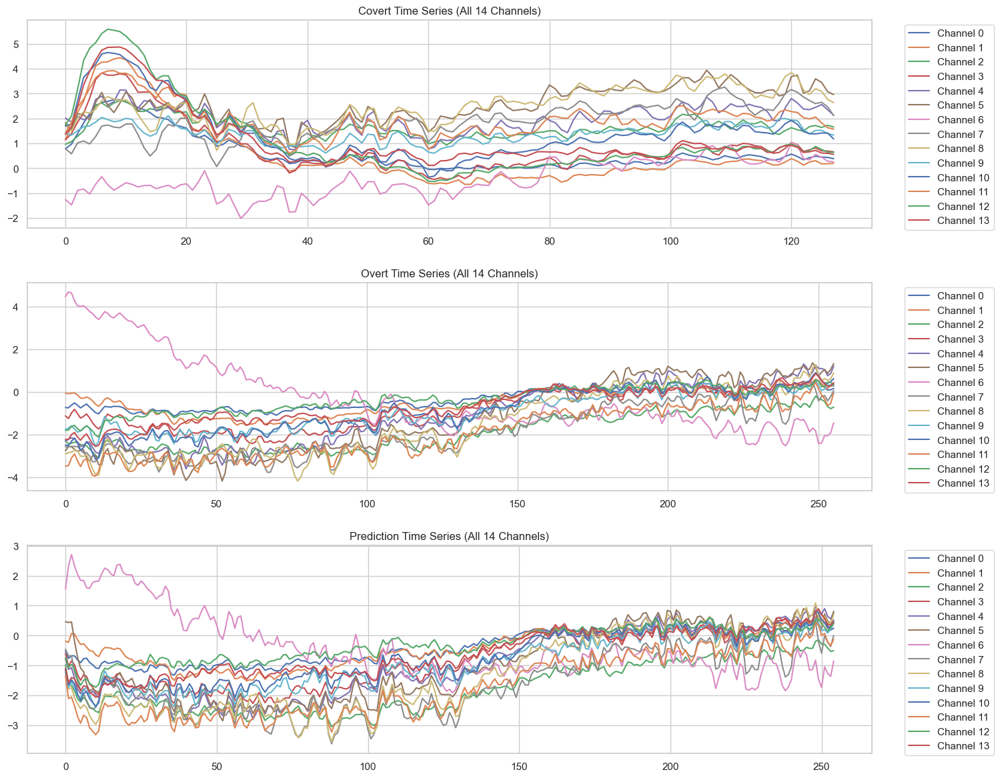

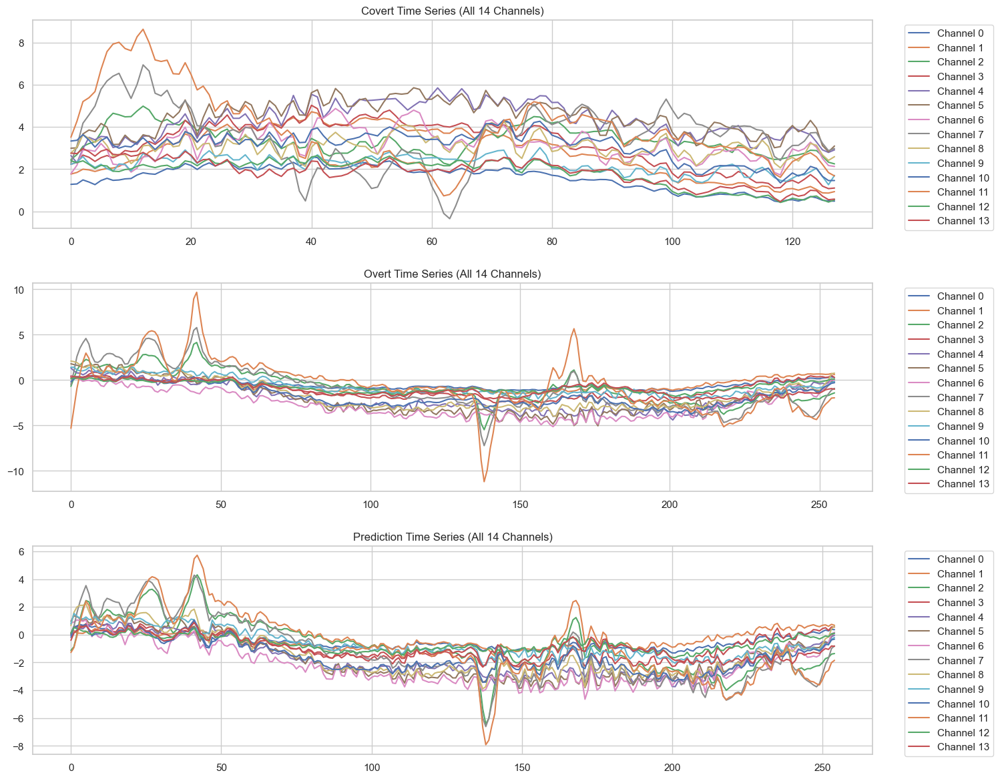

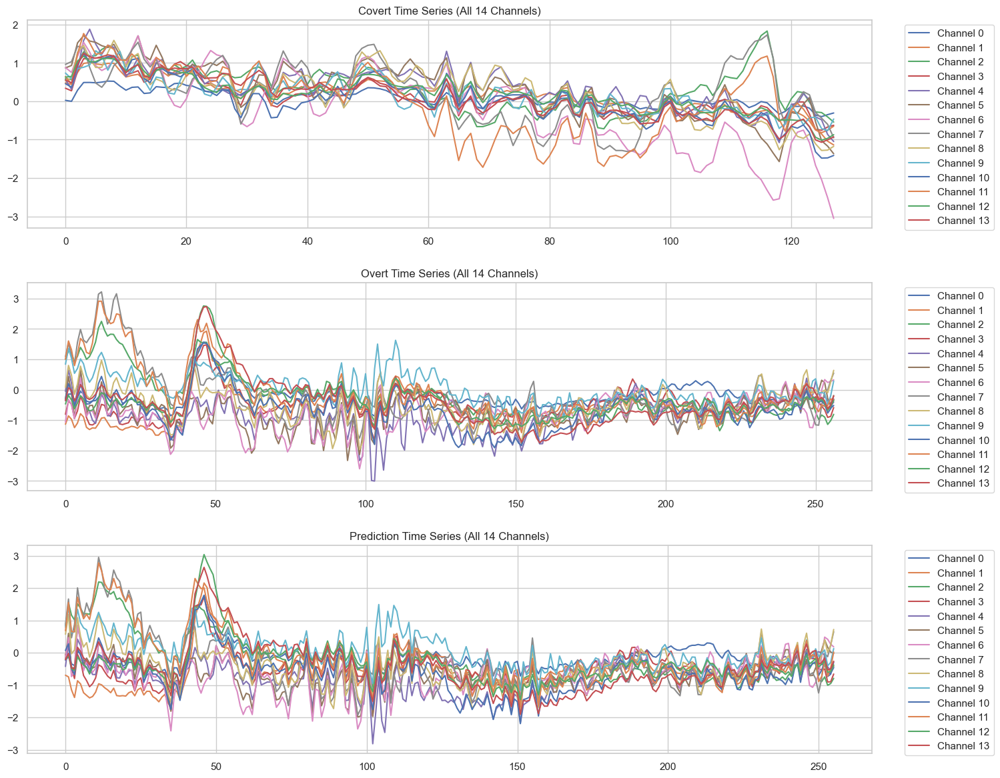

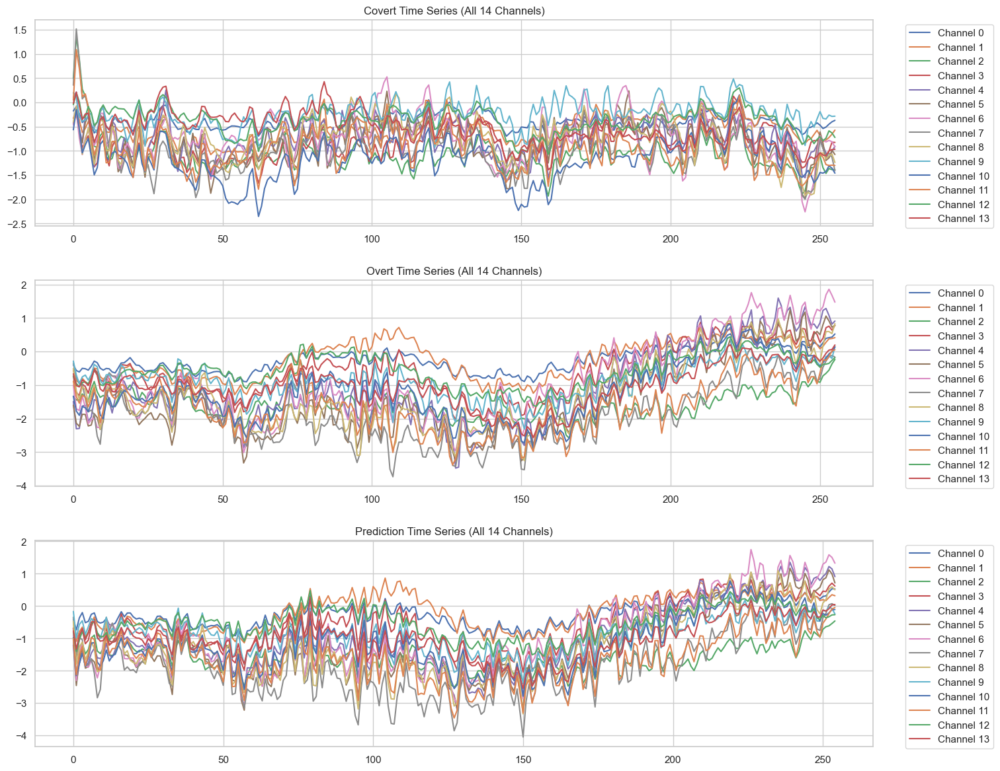

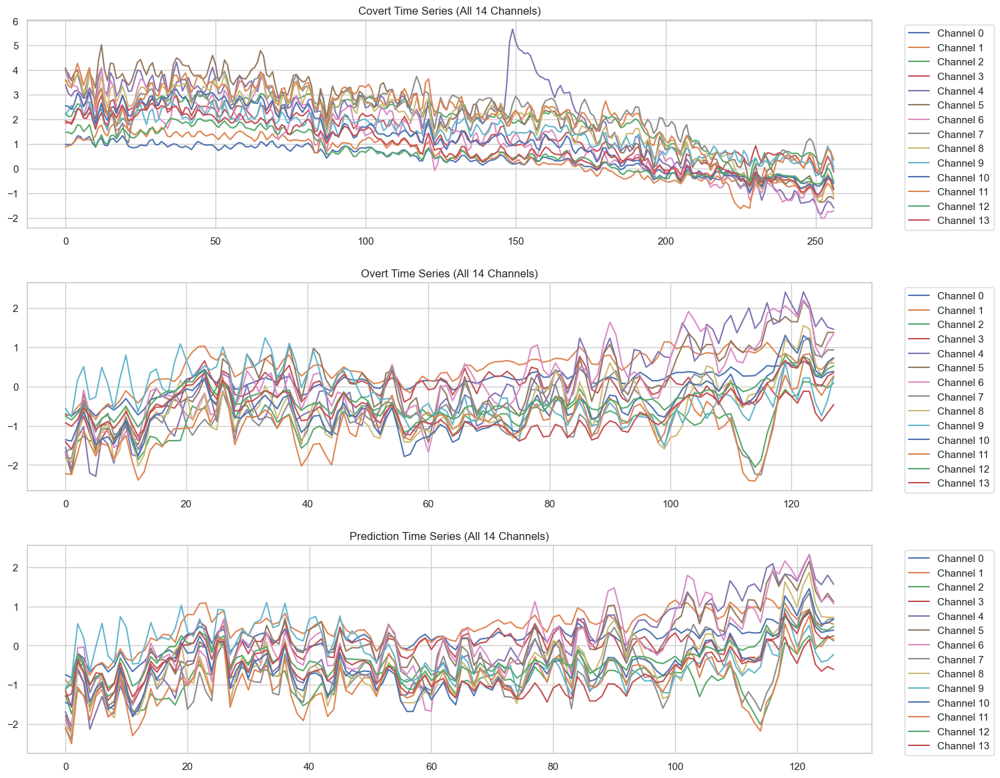

...

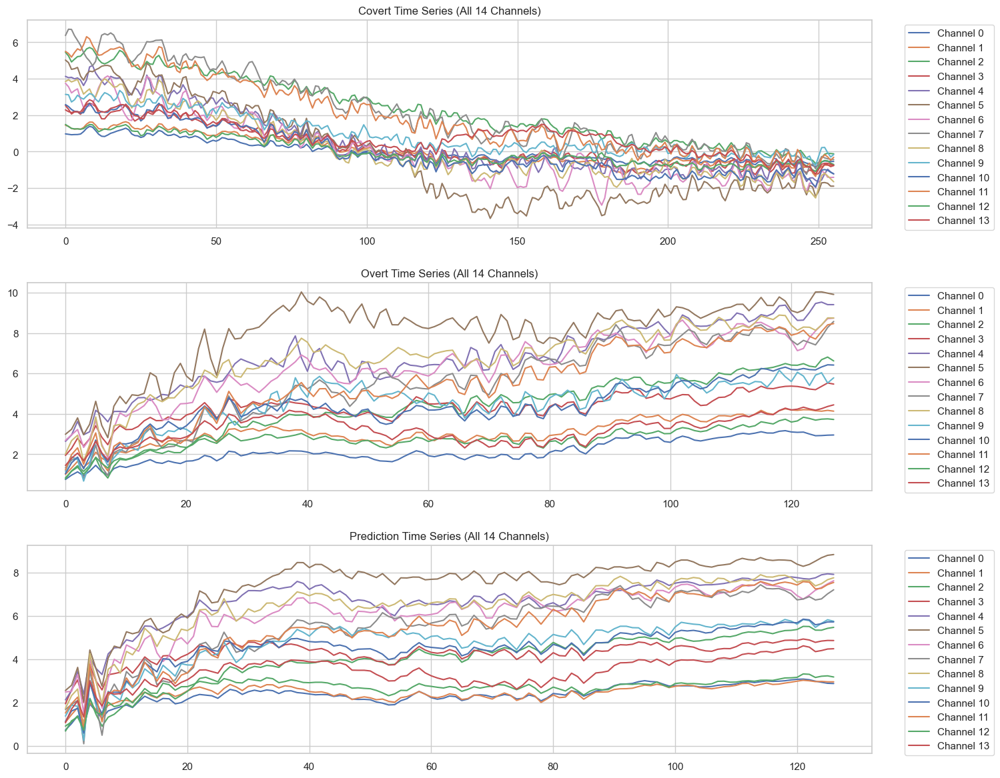

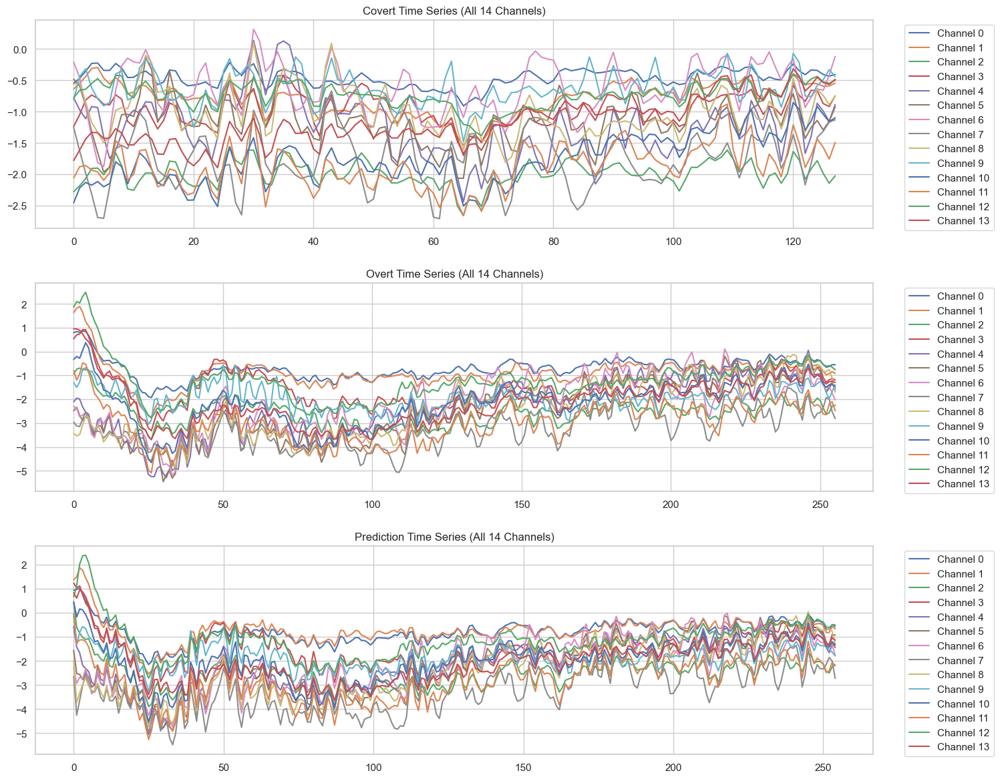

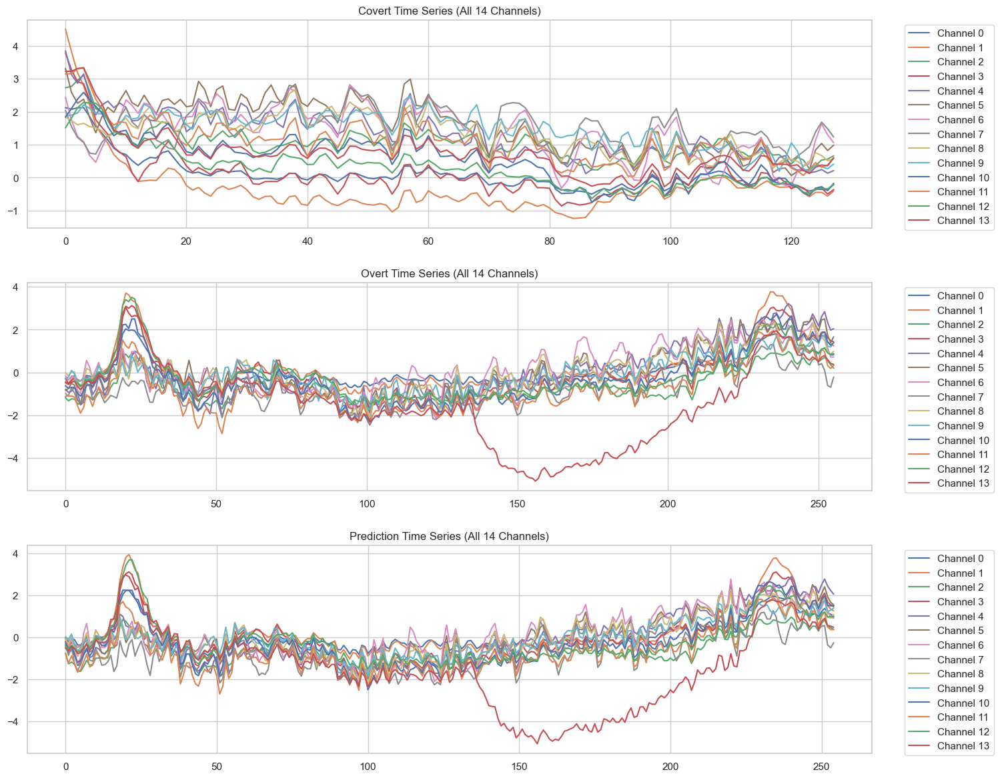

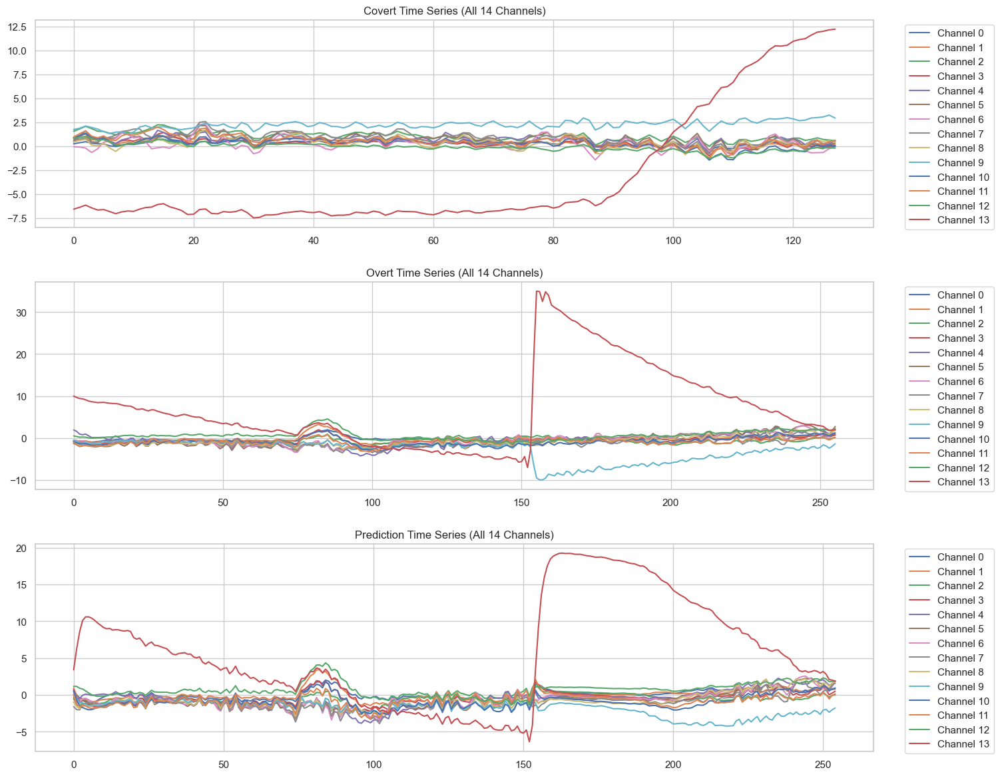

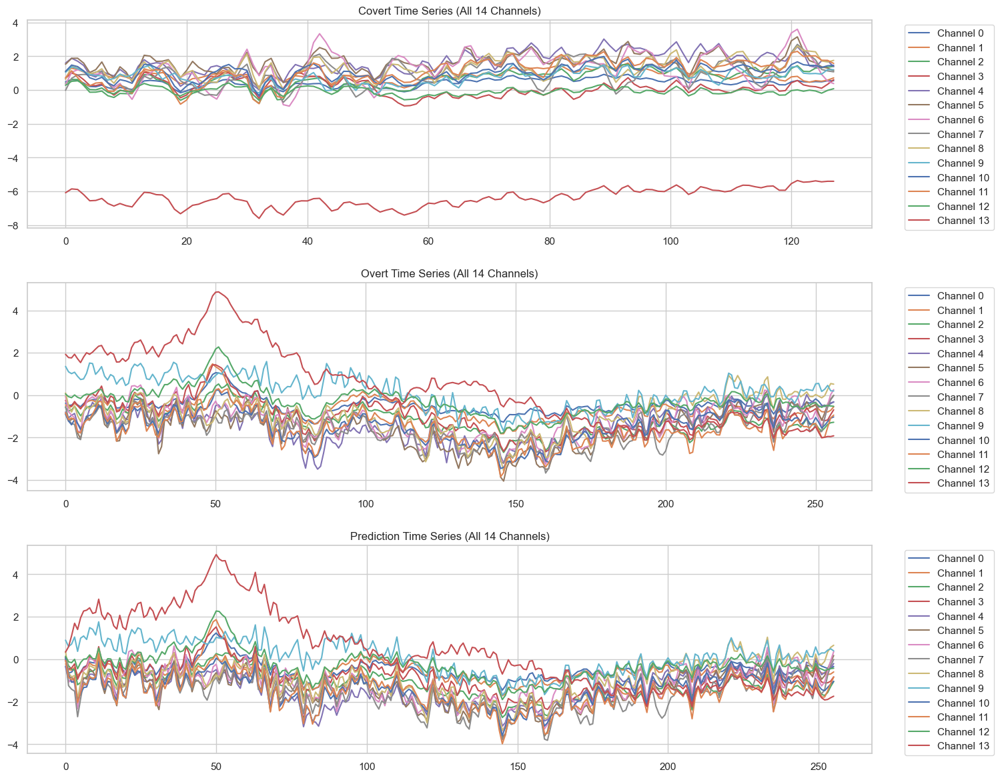

In [46]:
iter = 0
for item in val_dataset:
    covert, overt = item
    covert = covert.unsqueeze(0).to(device)
    overt = overt.unsqueeze(0).to(device)
    
    with torch.no_grad():
        prediction = model(covert, overt[:, :-1, :])
    
    prediction = prediction.cpu().numpy()
    covert = covert.cpu().numpy()
    overt = overt.cpu().numpy()

    fig, ax = plt.subplots(3, 1, figsize=(15, 12))
    
    for channel in range(covert.shape[2]):
        ax[0].plot(covert[0, :, channel], label=f'Channel {channel}')
    ax[0].set_title('Covert Time Series (All 14 Channels)')
    ax[0].legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    
    for channel in range(overt.shape[2]):
        ax[1].plot(overt[0, :, channel], label=f'Channel {channel}')
    ax[1].set_title('Overt Time Series (All 14 Channels)')
    ax[1].legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    
    for channel in range(prediction.shape[2]):
        ax[2].plot(prediction[0, :, channel], label=f'Channel {channel}')
    ax[2].set_title('Prediction Time Series (All 14 Channels)')
    ax[2].legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    
    plt.tight_layout()
    plt.show()
    iter += 1
    if iter > 10:
        break

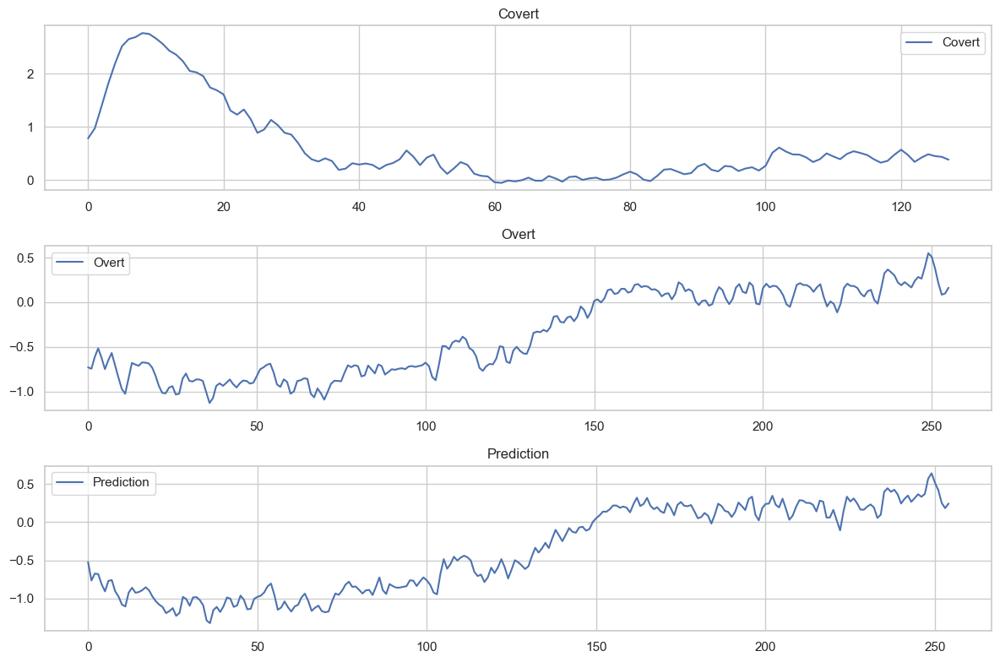

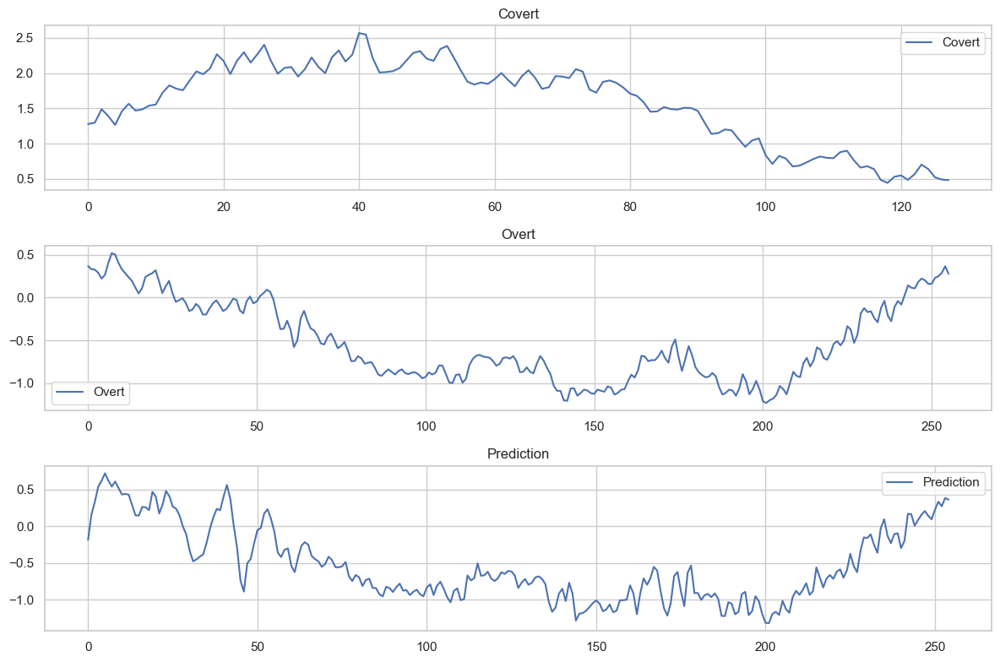

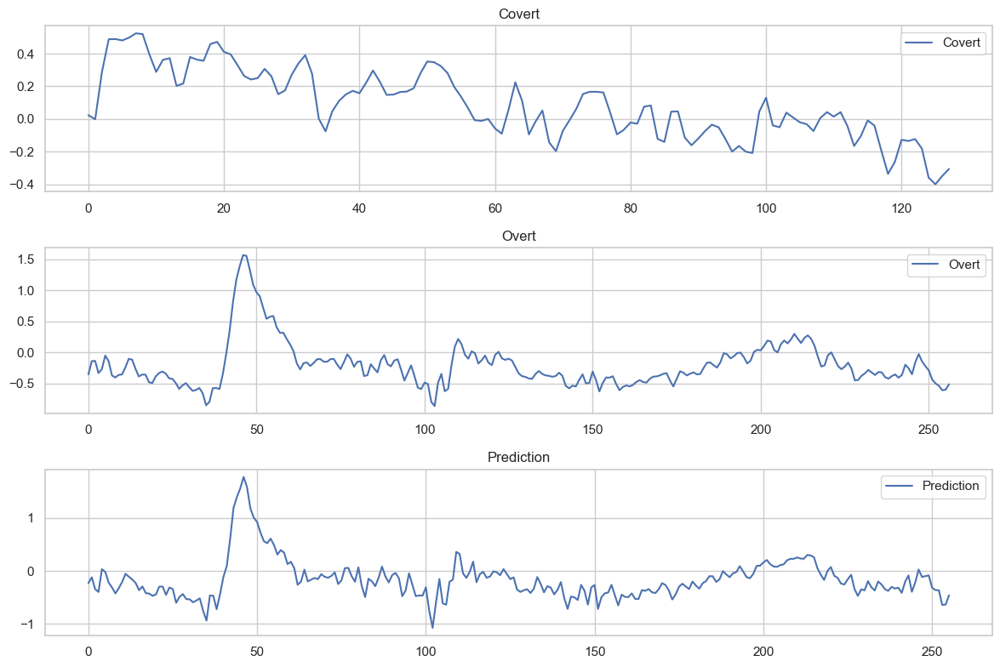

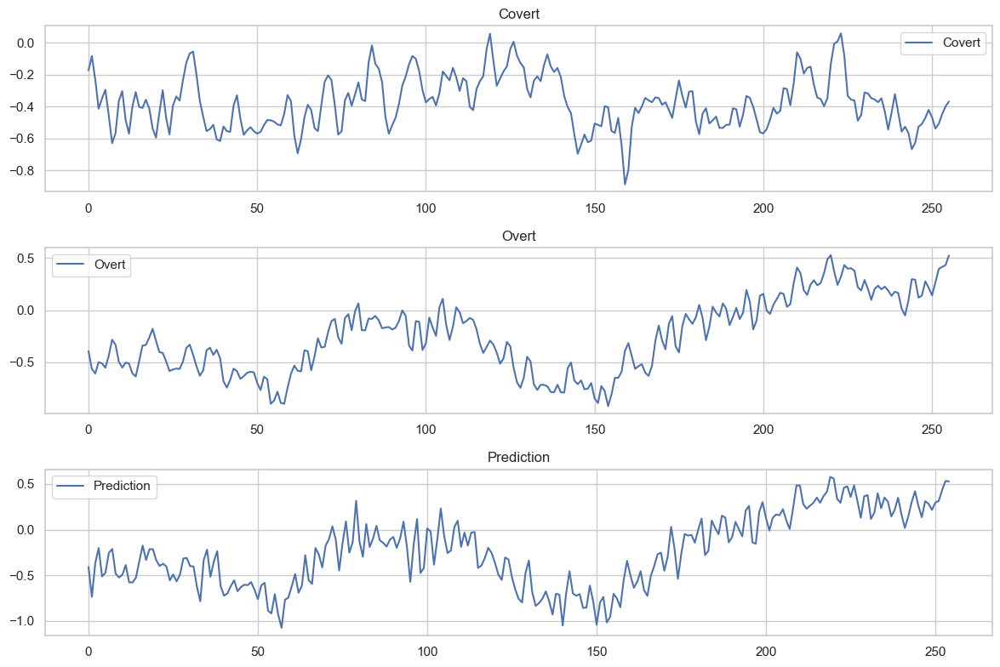

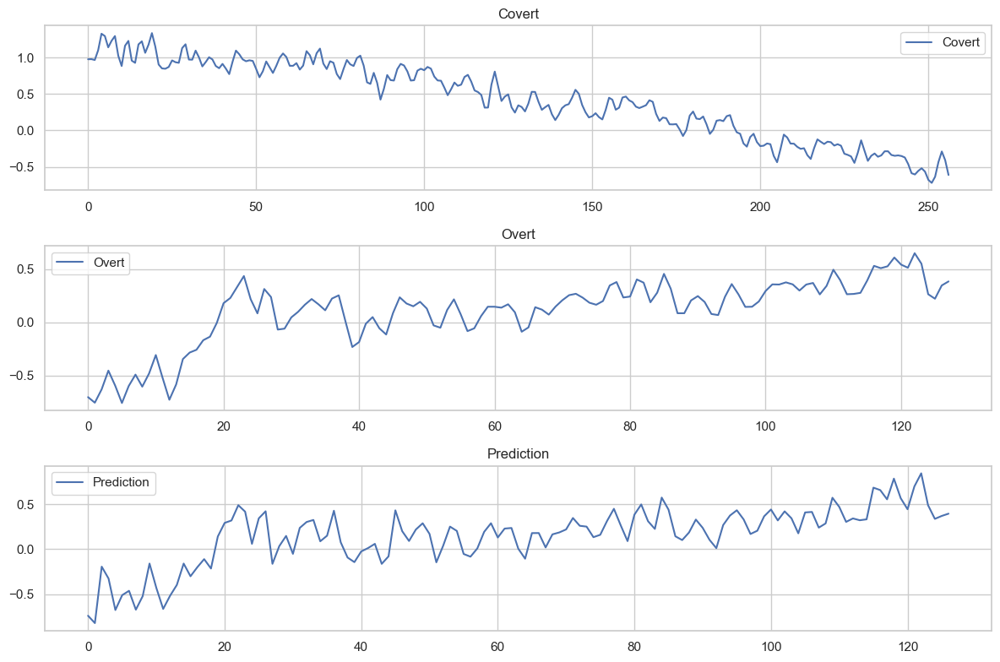

...

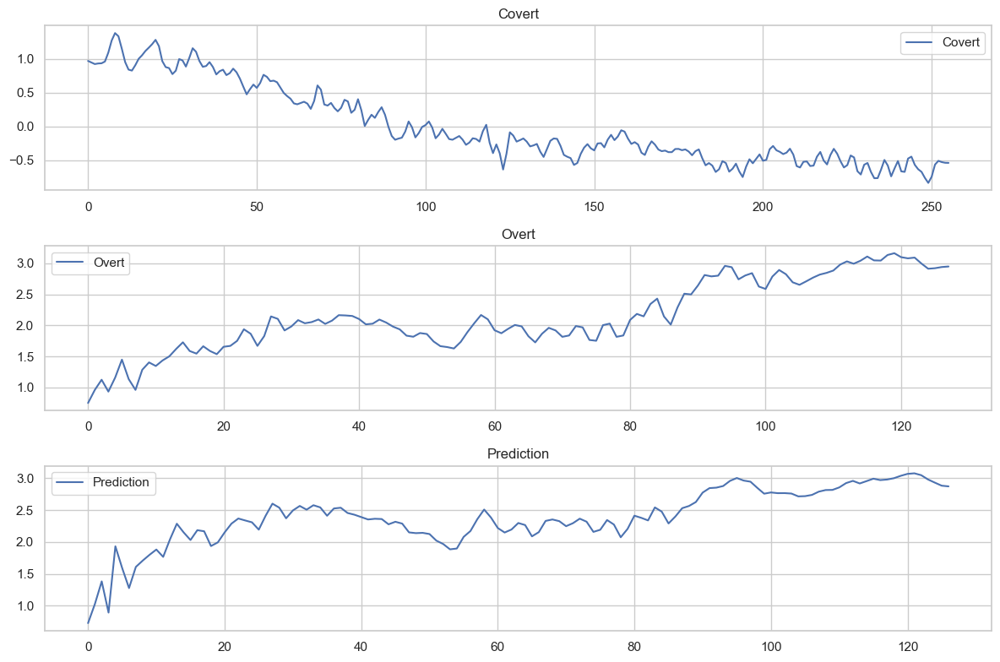

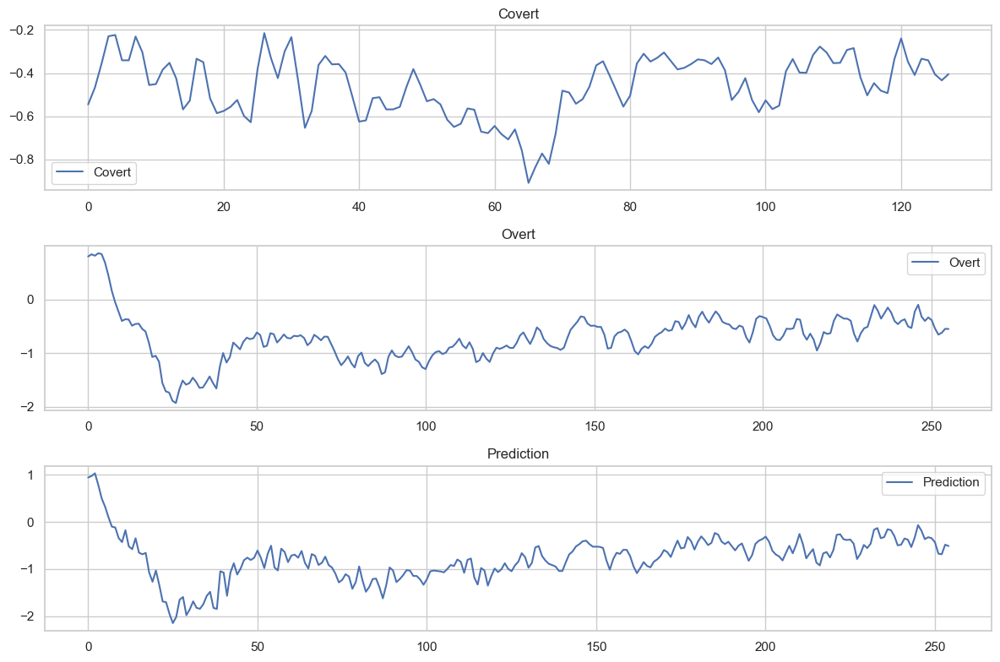

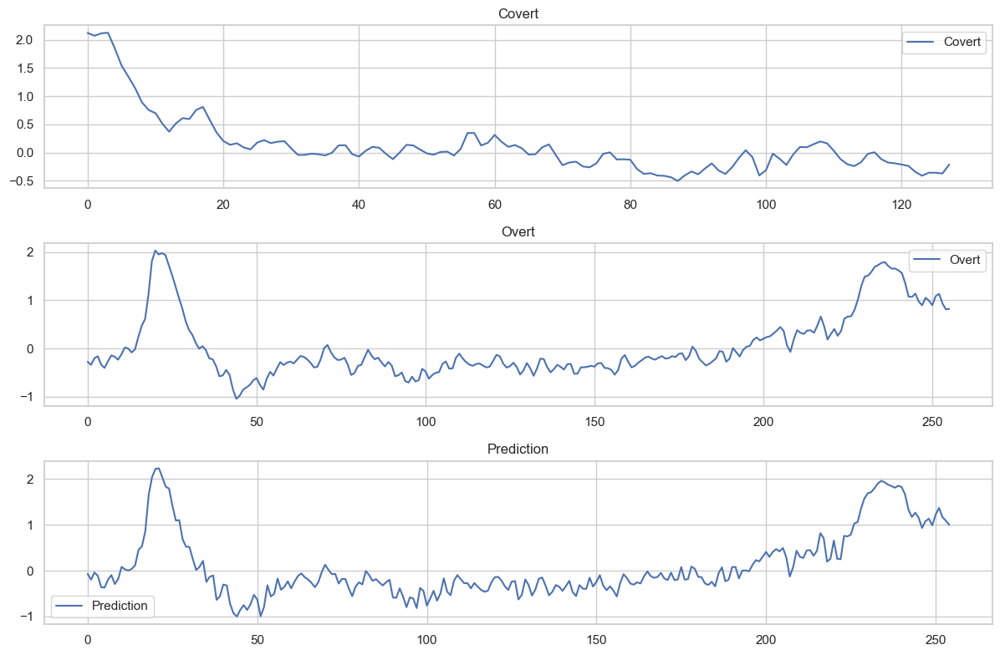

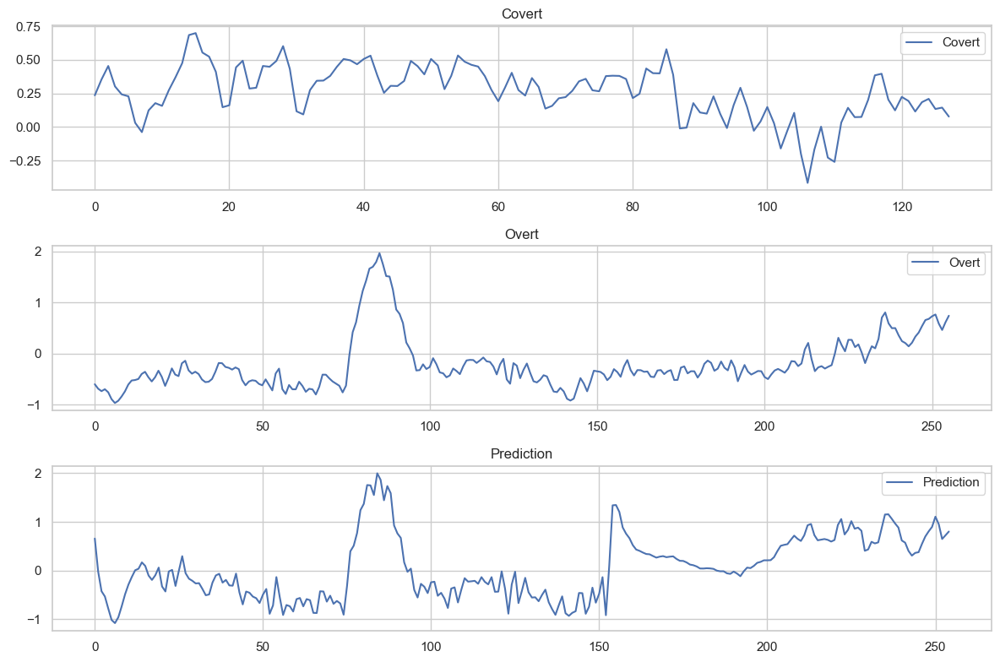

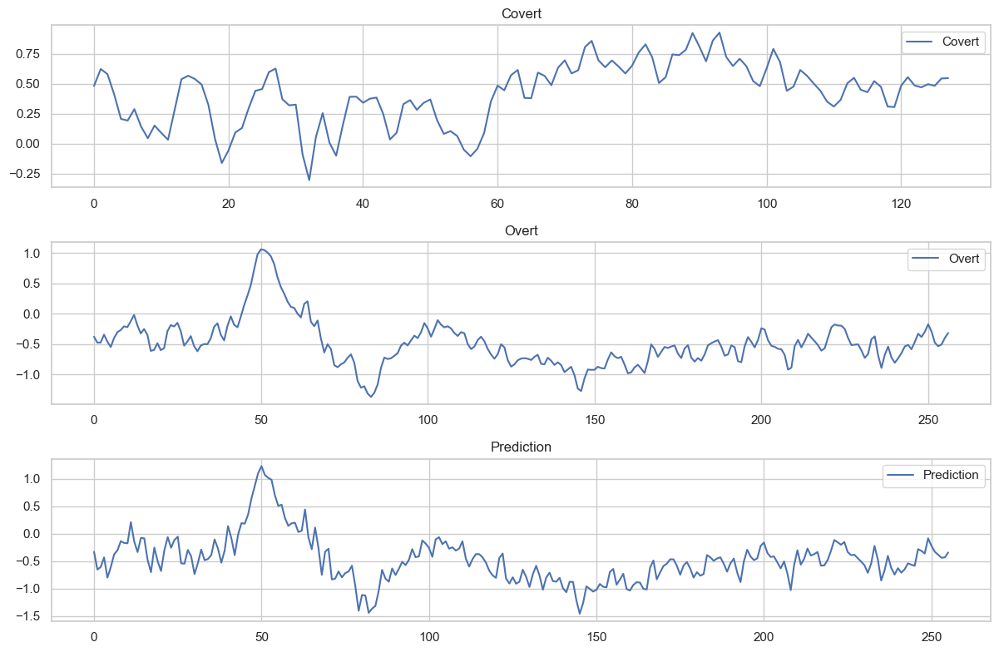

In [47]:
# Single channel for easier interpretation
iter = 0
for item in val_dataset:
    covert, overt = item
    covert = covert.unsqueeze(0).to(device)
    overt = overt.unsqueeze(0).to(device)

    with torch.no_grad():
        prediction = model(covert, overt[:, :-1, :])

    prediction = prediction.cpu().numpy()
    covert = covert.cpu().numpy()
    overt = overt.cpu().numpy()

    fig, ax = plt.subplots(3, 1, figsize=(12, 8))
    ax[0].plot(covert[0, :, 0], label='Covert')
    ax[0].set_title('Covert')
    ax[0].legend()
    ax[1].plot(overt[0, :, 0], label='Overt')
    ax[1].set_title('Overt')
    ax[1].legend()
    ax[2].plot(prediction[0, :, 0], label='Prediction')
    ax[2].set_title('Prediction')
    ax[2].legend()
    plt.tight_layout()
    plt.show()
    iter += 1
    if iter > 10:
        break

In [ ]:
import numpy
l=[(numpy.datetime64('1970-01-01T00:00:01.742289650'), numpy.datetime64('1970-01-01T00:00:01.742289650')), (numpy.datetime64('1970-01-01T00:00:01.742289650'), numpy.datetime64('1970-01-01T00:00:01.742289650')), (numpy.datetime64('1970-01-01T00:00:01.742289650'), numpy.datetime64('1970-01-01T00:00:01.742289650')), (numpy.datetime64('1970-01-01T00:00:01.742289650'), numpy.datetime64('1970-01-01T00:00:01.742289650')), (numpy.datetime64('1970-01-01T00:00:01.742289650'), numpy.datetime64('1970-01-01T00:00:01.742289650')), (numpy.datetime64('1970-01-01T00:00:01.742289650'), numpy.datetime64('1970-01-01T00:00:01.742289650')), (numpy.datetime64('1970-01-01T00:00:01.742289650'), numpy.datetime64('1970-01-01T00:00:01.742289650')), (numpy.datetime64('1970-01-01T00:00:01.742289650'), numpy.datetime64('1970-01-01T00:00:01.742289650')), (numpy.datetime64('1970-01-01T00:00:01.742289650'), numpy.datetime64('1970-01-01T00:00:01.742289650')), (numpy.datetime64('1970-01-01T00:00:01.742289650'), numpy.datetime64('1970-01-01T00:00:01.742289650'))]


In [ ]:
df = pd.read_csv("data/Aws Safi1742289648917_EPOCX_211983_2025.03.18T12.20.50+03.00.md.pm.bp.csv")
df.set_index('Timestamp', inplace=True)

In [ ]:
overt = {"start":[], "end":[]}
covert = {"start":[], "end":[]}
for i,log in enumerate(logs['1742289648917']):
    if log[1] == 'red':
        overt['start'].append(log[0])
        overt['end'].append(logs['1742289648917'][i+1][0])
    elif log[1] == 'blue':
        covert['start'].append(log[0])
        covert['end'].append(logs['1742289648917'][i+1][0])



In [ ]:
idx = df.index.to_numpy()

In [ ]:
overt_start_idx = np.searchsorted(idx, overt['start'])
overt_end_idx = np.searchsorted(idx, overt['end'])
covert_start_idx = np.searchsorted(idx, covert['start'])
covert_end_idx = np.searchsorted(idx, covert['end'])